In [1]:
import pandas as pd
from aicsimageio import AICSImage
import numpy as np
import xarray as xr
import sims
import cv2
from skimage import measure, transform, morphology, segmentation, filters, color, feature
import matplotlib.pyplot as plt
import omnipose
from cellpose_omni import io, transforms, models, plot



import glob
import re

/Users/madisond/Desktop/microscopy/microscopy/.env/lib/python3.9/site-packages/pydantic/_migration.py:276: UserWarning: `pydantic.error_wrappers:ValidationError` has been moved to `pydantic:ValidationError`.
  warnings.warn(f'`{import_path}` has been moved to `{new_location}`.')
/Users/madisond/Desktop/microscopy/microscopy/.env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading in the files

In [2]:
fpaths=glob.glob('../../../Downloads/md_cell_density/*dapi*tiff')


i = 1
fpath=fpaths[i]

if fpath.endswith('czi'):
    pass
    # f_img, f_pix_size = parse_CZI(fpath, img, size=size)
else:
    f_img = cv2.imread(fpath)    # this is the one that will load the tiffs

View the image

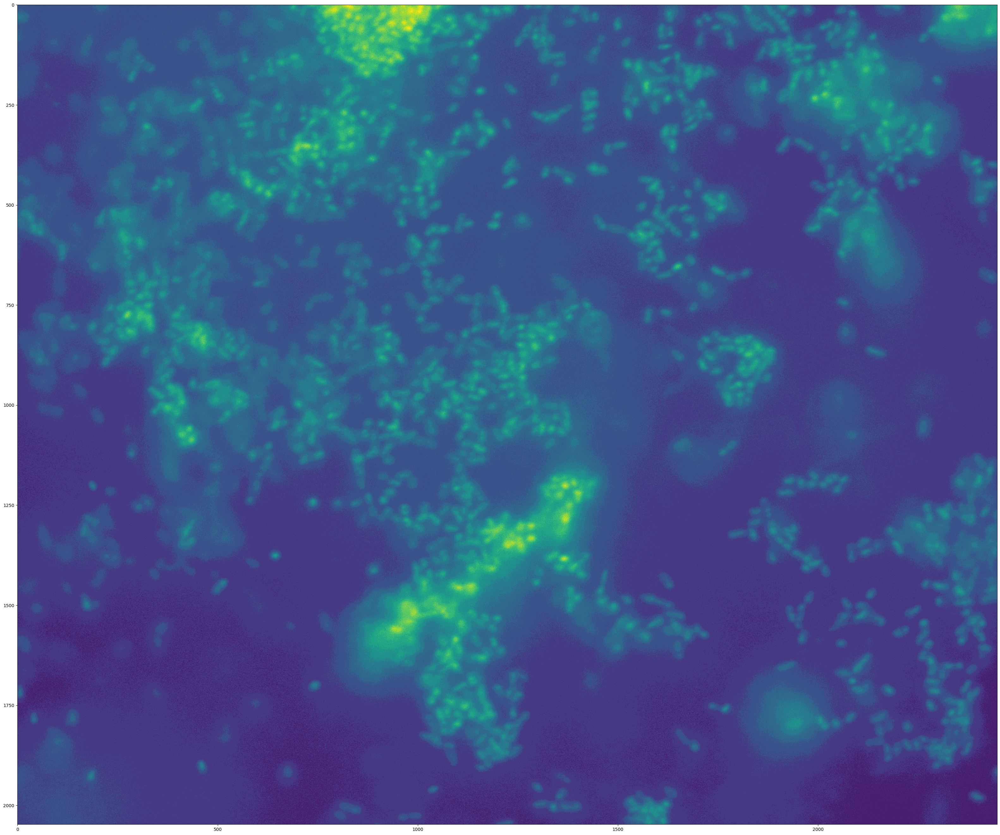

In [3]:
plt.figure(figsize=(40,40))
plt.imshow(f_img[:,:,0])

Load Model 

In [5]:
f_img_norm = omnipose.utils.normalize99(f_img[:,:,0])
om_model = models.CellposeModel(gpu=False, model_type='bact_fluor_omni')

2023-08-22 17:36:25,733 [INFO] >>bact_fluor_omni<< model set to be used
2023-08-22 17:36:25,734 [INFO] >>>> using CPU
2023-08-22 17:36:25,735 [INFO] WARNING: MKL version on torch not working/installed - CPU version will be slightly slower.
2023-08-22 17:36:25,735 [INFO] see https://pytorch.org/docs/stable/backends.html?highlight=mkl


Run model and plot results

True flow error 0.4975984 0.0887820806371329


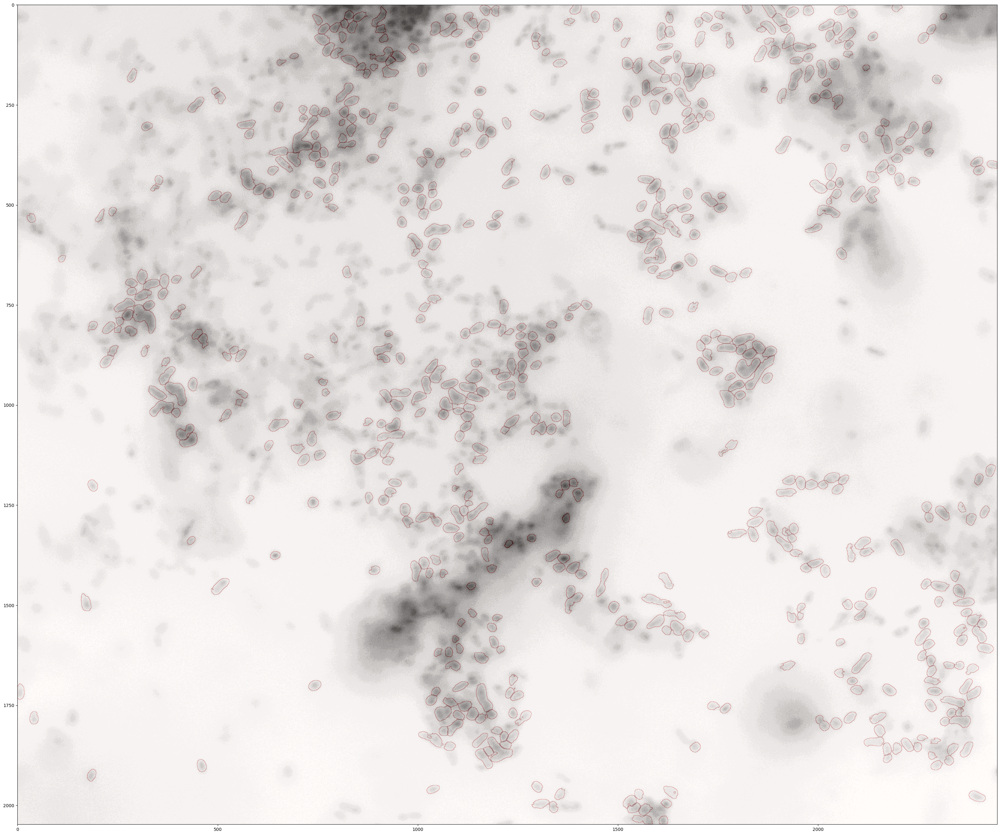

In [6]:
masks, flows, styles = om_model.eval([f_img_norm], rescale=None, mask_threshold=-1, transparency=True, niter=None,
                                  omni=True, cluster=True, resample=True, verbose=False, tile=False, 
                                  augment=False)


plt.figure(figsize=(40,40))
plt.imshow(f_img_norm, cmap='Greys')
plt.imshow(flows[0][-1], cmap='Reds', alpha=0.3)

Plot recommended by "them"? 

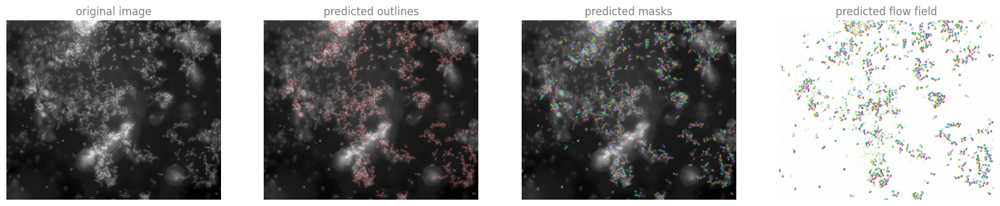

In [7]:
fig = plt.figure(figsize=(20,80))
fig.patch.set_facecolor([0]*4)

flows[0][0].shape
plot.show_segmentation(fig, f_img_norm, maski=masks[0], flowi=flows[0][0], bdi=flows[0][-1], omni=True)

Get Stats

In [10]:
#plt.imshow(masks[0])

x = measure.label(masks[0], return_num=True)
print([x for x in measure.regionprops(measure.label(masks[0]))[0]])


['area', 'area_bbox', 'area_convex', 'area_filled', 'axis_major_length', 'axis_minor_length', 'bbox', 'centroid', 'centroid_local', 'coords', 'eccentricity', 'equivalent_diameter_area', 'euler_number', 'extent', 'feret_diameter_max', 'image', 'image_convex', 'image_filled', 'inertia_tensor', 'inertia_tensor_eigvals', 'label', 'moments', 'moments_central', 'moments_hu', 'moments_normalized', 'orientation', 'perimeter', 'perimeter_crofton', 'slice', 'solidity']


In [9]:
import numpy as np
np.mask(masks[0])

AttributeError: module 'numpy' has no attribute 'mask'